In [54]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [55]:
df2 = pd.read_csv('/content/ResturantDataset.csv')

In [56]:
df2

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [57]:
df2.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,9


In [58]:
df2['Cuisines'].fillna(df2['Cuisines'].mode()[0], inplace=True)

In [59]:
df2.isnull().sum()

,0
Restaurant ID,0
Restaurant Name,0
Country Code,0
City,0
Address,0
Locality,0
Locality Verbose,0
Longitude,0
Latitude,0
Cuisines,0


In [60]:
pip install folium


In [61]:
df2['Latitude']

,Latitude
0,14.565443
1,14.553708
2,14.581404
3,14.585318
4,14.584450
...,...
9546,41.022793
9547,41.009847
9548,41.055817
9549,41.057979


In [62]:
df2['Longitude']

,Longitude
0,121.027535
1,121.014101
2,121.056831
3,121.056475
4,121.057508
...,...
9546,28.977392
9547,29.041297
9548,29.034640
9549,29.036019


In [63]:
df2[['Latitude', 'Longitude']].isnull().sum()

,0
Latitude,0
Longitude,0


In [64]:
import folium
from IPython.display import display

In [65]:
map_center = [df2['Latitude'].mean(), df2['Longitude'].mean()]

In [66]:
restaurant_map = folium.Map(location=map_center, zoom_start=12)


In [67]:
for _, row in df2.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Restaurant: {row['Restaurant Name']}, Cuisine: {row['Cuisines']}",
    ).add_to(restaurant_map)

In [68]:
restaurant_map

In [74]:
restaurants_per_area = df2.groupby('City')['Restaurant Name'].count().reset_index()

In [76]:
restaurants_per_area.columns = ['City', 'Number of Restaurants']


In [77]:
restaurants_per_area = restaurants_per_area.sort_values(by='Number of Restaurants', ascending=False)

In [79]:
print(restaurants_per_area.head(10))

            City  Number of Restaurants
88     New Delhi                   5473
50       Gurgaon                   1118
89         Noida                   1080
43     Faridabad                    251
48     Ghaziabad                     25
17  Bhubaneshwar                     21
69       Lucknow                     21
5       Amritsar                     21
2      Ahmedabad                     21
51      Guwahati                     21


In [80]:
top_areas = restaurants_per_area.head(10)


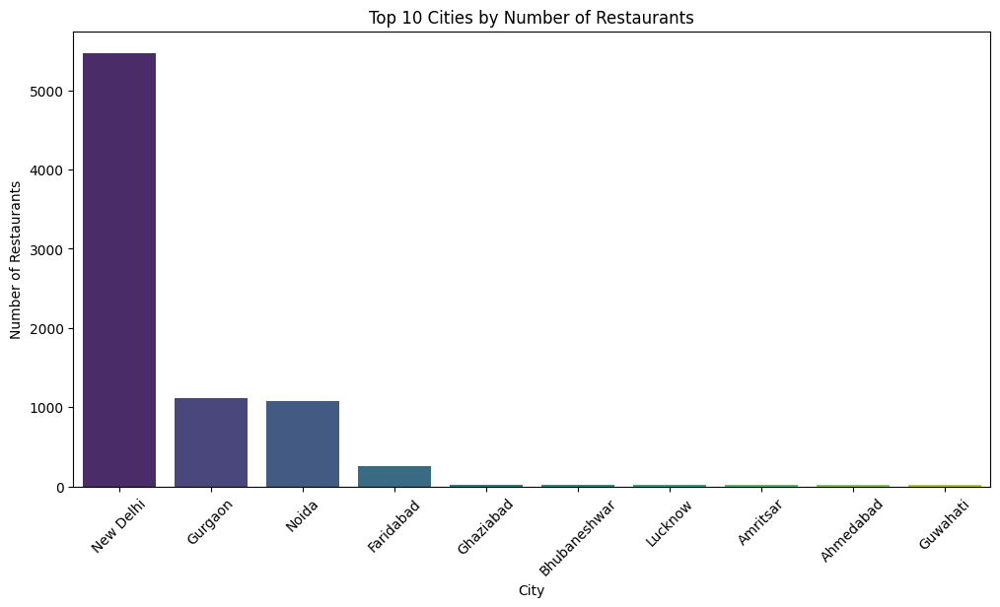

In [81]:
plt.figure(figsize=(12, 6))
sns.barplot(data=top_areas, x='City', y='Number of Restaurants', palette='viridis')
plt.xticks(rotation=45)
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.show()

In [85]:
average_price_range = df2.groupby('City')['Price range'].mean().reset_index()


In [86]:
average_price_range.columns = ['City', 'Average Price Range']

In [87]:
average_price_range = average_price_range.sort_values(by='Average Price Range', ascending=False)

In [88]:
print("\nTop cities by average price range:")
average_price_range.head(10)


Top cities by average price range:


,City,Average Price Range
104,Princeton,4.000000
56,Inner City,4.000000
133,Vineland Station,4.000000
60,Johannesburg,4.000000
93,Panchkula,4.000000
94,Pasay City,4.000000
97,Paynesville,4.000000
113,Sandton,3.818182
75,Mandaluyong City,3.750000
103,Pretoria,3.700000
